<center><h1 style="font-size:35px; font-family: 'Times New Roman'; letter-spacing: 0.1em;">Exploratory Data Analysis (EDA) 🛒</h1></center>

<h1 style="font-family: 'Times New Roman'; letter-spacing: 0.08em;">Introduction</h1>

<div style="text-align: center;"><img src="Images/Instacart.png" alt="Instacart mobile app screens" width="400"/></div>

**Instacart** is the leading grocery technology company in North of America, partnering with more than 1,400 national, regional, and local retail banners to deliver from more than 80,000 stores across more than 14,000 cities in North America.


The key objective of the project is to uncover patterns in the purchasing habits of Instacart shoppers and
provide recommendations based on the average shopper's behaviour.

**Main questions to answer:**
- How many orders are made at different hours of the day, different days of the week?
- How many items do people buy?
- After how many days do people order again?
- How many items do people buy since a previous order?
- Which items are the best-sellers? 
- Which items are most frequently reordered?
- Which items are added to the cart first? second? third?
- How often and when are products from different department/aisle sold?

We will answer these questions in a moment.

<h1 style="font-family: 'Times New Roman'; letter-spacing: 0.08em;">Loading the Data</h1>

In [1]:
import pandas as pd
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
color = sns.color_palette()
sns.set_theme()
%matplotlib inline
plt.style.use("fivethirtyeight")
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import squarify
from sklearn.cluster import KMeans

In [2]:
df_orders_train = pd.read_csv("Data/order_products__train.csv")
df_orders_prior = pd.read_csv("Data/order_products__prior.csv")
df_orders= pd.read_csv("Data/orders.csv")
df_products = pd.read_csv("Data/products.csv")
df_aisles= pd.read_csv("Data/aisles.csv")
df_departments = pd.read_csv("Data/departments.csv")

<h1 style="font-family: 'Times New Roman'; letter-spacing: 0.08em;">Missing Values and Duplicates</h1>

In [3]:
dataframes = [df_aisles, df_departments, df_products, df_orders, df_orders_prior, df_orders_train]

for df in dataframes:
    df_name = [name for name, obj in locals().items() if obj is df][0]
    print(f'{df_name} has duplicates: {df.duplicated().values.any()}')
    print(f'{df_name} has NaN values: {df.isna().values.any()}')

df_aisles has duplicates: False
df_aisles has NaN values: False
df_departments has duplicates: False
df_departments has NaN values: False
df_products has duplicates: False
df_products has NaN values: False
df_orders has duplicates: False
df_orders has NaN values: True
df_orders_prior has duplicates: False
df_orders_prior has NaN values: False
df_orders_train has duplicates: False
df_orders_train has NaN values: False


* There are no duplicates in all dataframes.
* However, `df_orders` dataframe has missing values but there no need to deal with it now in EDA Step .

In [6]:
df_orders.isna().sum()

order_id                       0
user_id                        0
eval_set                       0
order_number                   0
order_dow                      0
order_hour_of_day              0
days_since_prior_order    206209
dtype: int64

In [5]:
df_orders.groupby('eval_set').count()

,order_id,user_id,order_number,order_dow,order_hour_of_day,days_since_prior_order
eval_set,,,,,,
prior,3214874,3214874,3214874,3214874,3214874,3008665
test,75000,75000,75000,75000,75000,75000
train,131209,131209,131209,131209,131209,131209


* The only column with **206,209 NaN values** is `'days_since_prior_order'` in the `'prior'` evaluation set.
* NaN values in this column mean that its the very first order by a user and are not connected with any issue.
* **75,000 orders** in `'test'` data are reserved for machine learning competition. No product data in this evaluation set is expected.

<h1 style="font-family: 'Times New Roman'; letter-spacing: 0.08em;">1: Products</h1>

In [ ]:
print(df_products.info())
df_products.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49688 entries, 0 to 49687
Data columns (total 4 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   product_id     49688 non-null  int64 
 1   product_name   49688 non-null  object
 2   aisle_id       49688 non-null  int64 
 3   department_id  49688 non-null  int64 
dtypes: int64(3), object(1)
memory usage: 1.5+ MB
None


,product_id,product_name,aisle_id,department_id
0,1,Chocolate Sandwich Cookies,61,19
1,2,All-Seasons Salt,104,13
2,3,Robust Golden Unsweetened Oolong Tea,94,7
3,4,Smart Ones Classic Favorites Mini Rigatoni Wit...,38,1
4,5,Green Chile Anytime Sauce,5,13


* No issues with the data type.
* There are **49,688 products** available on the platform.

<h1 style="font-family: 'Times New Roman'; letter-spacing: 0.08em;">2: Aisles</h1>

In [7]:
print(df_aisles.info())
df_aisles.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 134 entries, 0 to 133
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   aisle_id  134 non-null    int64 
 1   aisle     134 non-null    object
dtypes: int64(1), object(1)
memory usage: 2.2+ KB
None


,aisle_id,aisle
0,1,prepared soups salads
1,2,specialty cheeses
2,3,energy granola bars
3,4,instant foods
4,5,marinades meat preparation


* No issues with the data type.
* Products on the platform are organized into **134 aisles**.

<h1 style="font-family: 'Times New Roman'; letter-spacing: 0.08em;">3: Departments</h1>

In [8]:
print(df_departments.info())
df_departments.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21 entries, 0 to 20
Data columns (total 2 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   department_id  21 non-null     int64 
 1   department     21 non-null     object
dtypes: int64(1), object(1)
memory usage: 468.0+ bytes
None


,department_id,department
0,1,frozen
1,2,other
2,3,bakery
3,4,produce
4,5,alcohol


* No issues with the data type.
* Aisles on the platform are grouped into **21 departments**.

<h1 style="font-family: 'Times New Roman'; letter-spacing: 0.08em;">4: Orders</h1>

In [9]:
print(df_orders.info())
df_orders.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3421083 entries, 0 to 3421082
Data columns (total 7 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   order_id                int64  
 1   user_id                 int64  
 2   eval_set                object 
 3   order_number            int64  
 4   order_dow               int64  
 5   order_hour_of_day       int64  
 6   days_since_prior_order  float64
dtypes: float64(1), int64(5), object(1)
memory usage: 182.7+ MB
None


,order_id,user_id,eval_set,order_number,order_dow,order_hour_of_day,days_since_prior_order
0,2539329,1,prior,1,2,8,NaN
1,2398795,1,prior,2,3,7,15.0
2,473747,1,prior,3,3,12,21.0
3,2254736,1,prior,4,4,7,29.0
4,431534,1,prior,5,4,15,28.0


In [10]:
# User count and their orders count
df_orders.groupby('user_id').count().sort_values('order_id', ascending=False)

,order_id,eval_set,order_number,order_dow,order_hour_of_day,days_since_prior_order
user_id,,,,,,
152340,100,100,100,100,100,99
185641,100,100,100,100,100,99
185524,100,100,100,100,100,99
81678,100,100,100,100,100,99
70922,100,100,100,100,100,99
...,...,...,...,...,...,...
13046,4,4,4,4,4,3
70208,4,4,4,4,4,3
111440,4,4,4,4,4,3


In [11]:
# How many users in the dataset placed their initial order?
new_users = df_orders.isna().days_since_prior_order.sum()

# What proportion of the total orders are initial orders
nu_share = new_users / df_orders.days_since_prior_order.count() * 100
print(f'There are {new_users} new users. Initial orders are {nu_share:.2}% of all orders.')

There are 206209 new users. Initial orders are 6.4% of all orders.


In [12]:
# Unique values in `order_dow` column
df_orders.order_dow.unique()

array([2, 3, 4, 1, 5, 0, 6], dtype=int64)

<h1 style="font-family: 'Times New Roman'; letter-spacing: 0.08em;">5: Orders Prior</h1>

In [13]:
print(df_orders_prior.info())
df_orders_prior.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32434489 entries, 0 to 32434488
Data columns (total 4 columns):
 #   Column             Dtype
---  ------             -----
 0   order_id           int64
 1   product_id         int64
 2   add_to_cart_order  int64
 3   reordered          int64
dtypes: int64(4)
memory usage: 989.8 MB
None


,order_id,product_id,add_to_cart_order,reordered
0,2,33120,1,1
1,2,28985,2,1
2,2,9327,3,0
3,2,45918,4,1
4,2,30035,5,0


* No issues with the data type.
* This file contains **previous order** contents for all customers and **specifies which products** were purchased in each order (there is a reference to `product_id`).
* `'reordered'` indicates that the customer has a previous order that contains the product:
    * 1 if this product has been ordered by this user in the past,
    * 0 otherwise.

<h1 style="font-family: 'Times New Roman'; letter-spacing: 0.08em;">6: Orders Train</h1>

In [14]:
print(df_orders_train.info())
df_orders_train.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1384617 entries, 0 to 1384616
Data columns (total 4 columns):
 #   Column             Non-Null Count    Dtype
---  ------             --------------    -----
 0   order_id           1384617 non-null  int64
 1   product_id         1384617 non-null  int64
 2   add_to_cart_order  1384617 non-null  int64
 3   reordered          1384617 non-null  int64
dtypes: int64(4)
memory usage: 42.3 MB
None


,order_id,product_id,add_to_cart_order,reordered
0,1,49302,1,1
1,1,11109,2,1
2,1,10246,3,0
3,1,49683,4,0
4,1,43633,5,1


* No issues with the data type.
* This file identifies **the last order for 131,209 users** (= 206,209 - 75,000) and **specifies which products** were purchased in each order (there is a reference to `product_id`).
* `'reordered'` indicates that the customer has a previous order that contains the product:
    * 1 if this product has been ordered by this user in the past,
    * 0 otherwise.

#### Dataset structure conclusion
* The dataset is a **relational set of 6 files** describing customers' orders over time.
* Three of them (`departments.csv`, `aisles.csv`, `products.csv`) contain product related information only.
* The other four contain information about users' orders:
    * `orders.csv` is the central file with an information about all orders made on the platform, but without product specifics.
    * `order_products__prior.csv` and `order_products__prior.csv` specifies which products were purchased in each order.
    * `order_products__train.csv` and `sample_submission.csv` (test) identify the last order for every user.

#### Data cleaning is not needed:
* no data type issues were identified.
* no duplicated values.
* no unexpected missing values.
* data in all files looks logically neat.

#### Dataset dimensions overview
* **Orders & users**:
    * The dataset is anonymized and contains a sample of over **3 million (3,421,083) grocery orders** from more than **200,000 (206,209) Instacart users**.
    * For each user, provided **between 4 and 100 of their orders**, with the sequence of products purchased in each order.
* **Product hierarchy**:
    * There are **49,688 products** available on the platform.
    * They are organized into **134 aisles** and **21 departments**.

<h1 style="font-family: 'Times New Roman'; letter-spacing: 0.08em;">Main DataFrames for further processing</h1>

In [15]:
# Prods_df = (df_products + df_departments + df_aisle)
prods_df = df_products.merge(df_departments[['department_id', 'department']], on='department_id', how='left',)
prods_df = prods_df.merge(df_aisles[['aisle_id', 'aisle']], on='aisle_id', how='left',)
prods_df.head()

,product_id,product_name,aisle_id,department_id,department,aisle
0,1,Chocolate Sandwich Cookies,61,19,snacks,cookies cakes
1,2,All-Seasons Salt,104,13,pantry,spices seasonings
2,3,Robust Golden Unsweetened Oolong Tea,94,7,beverages,tea
3,4,Smart Ones Classic Favorites Mini Rigatoni Wit...,38,1,frozen,frozen meals
4,5,Green Chile Anytime Sauce,5,13,pantry,marinades meat preparation


In [16]:
# orders_products_df = (df_orders_prior + df_orders_train + prods_df)
prior_train_orders = pd.concat([df_orders_prior, df_orders_train], ignore_index=True)
orders_products_df = pd.merge(prior_train_orders, prods_df, on='product_id')
orders_products_df.head()

,order_id,product_id,add_to_cart_order,reordered,product_name,aisle_id,department_id,department,aisle
0,2,33120,1,1,Organic Egg Whites,86,16,dairy eggs,eggs
1,2,28985,2,1,Michigan Organic Kale,83,4,produce,fresh vegetables
2,2,9327,3,0,Garlic Powder,104,13,pantry,spices seasonings
3,2,45918,4,1,Coconut Butter,19,13,pantry,oils vinegars
4,2,30035,5,0,Natural Sweetener,17,13,pantry,baking ingredients


In [17]:
# merged_df = (orders_products_df + df_orders)
merged_df = pd.merge(orders_products_df, df_orders, on='order_id')
merged_df.head()

,order_id,product_id,add_to_cart_order,reordered,product_name,aisle_id,department_id,department,aisle,user_id,eval_set,order_number,order_dow,order_hour_of_day,days_since_prior_order
0,2,33120,1,1,Organic Egg Whites,86,16,dairy eggs,eggs,202279,prior,3,5,9,8.0
1,2,28985,2,1,Michigan Organic Kale,83,4,produce,fresh vegetables,202279,prior,3,5,9,8.0
2,2,9327,3,0,Garlic Powder,104,13,pantry,spices seasonings,202279,prior,3,5,9,8.0
3,2,45918,4,1,Coconut Butter,19,13,pantry,oils vinegars,202279,prior,3,5,9,8.0
4,2,30035,5,0,Natural Sweetener,17,13,pantry,baking ingredients,202279,prior,3,5,9,8.0


<h1 style="font-family: 'Times New Roman'; letter-spacing: 0.08em;">How many items were sold on the platform?</h1>

In [18]:
orders_products_df.shape

(33819106, 9)

Users bought around **34 million products** on the platform.

<h1 style="font-family: 'Times New Roman'; letter-spacing: 0.08em;">How many orders are made at different hours of the day?</h1>

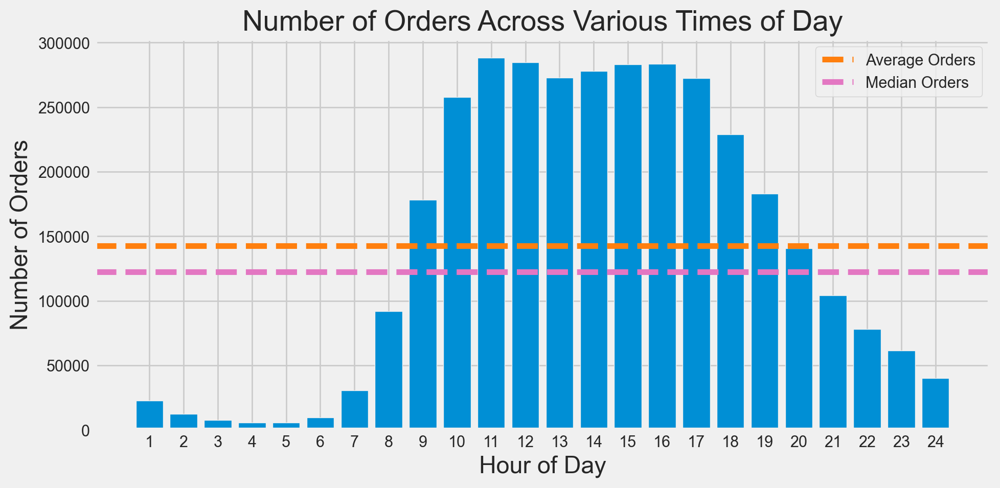

In [20]:
# Modify the index to start from 1
orders_per_hour = df_orders.order_hour_of_day.value_counts()

# Sorting the index to have a sequential x-axis
orders_per_hour = orders_per_hour.sort_index()

# Modify the index to start at 1 instead of 0
orders_per_hour.index = orders_per_hour.index + 1

# Calculate the average and median
avg_orders = orders_per_hour.values.mean()
median_orders = np.median(orders_per_hour.values)

# Creating the bar chart
plt.figure(figsize=(10, 5), dpi=200)
plt.bar(orders_per_hour.index, orders_per_hour.values)

# Adding the average and median lines
plt.axhline(avg_orders, color='tab:orange',linestyle='--', label='Average Orders')
plt.axhline(median_orders, color='tab:pink',linestyle='--', label='Median Orders')

# Adding titles and labels
plt.title('Number of Orders Across Various Times of Day')
plt.xlabel('Hour of Day')
plt.ylabel('Number of Orders')
plt.xticks(list(range(1, 25)))# Ensure all hours are shown on the x-axis, starting from 1
plt.legend()
plt.tight_layout()
plt.show()

The majority of orders are placed between 9:00 and 20:00, with the highest volume occurring **between 11:00 and 17:00**.

<h1 style="font-family: 'Times New Roman'; letter-spacing: 0.08em;">How many orders are made at different days of the week?</h1>

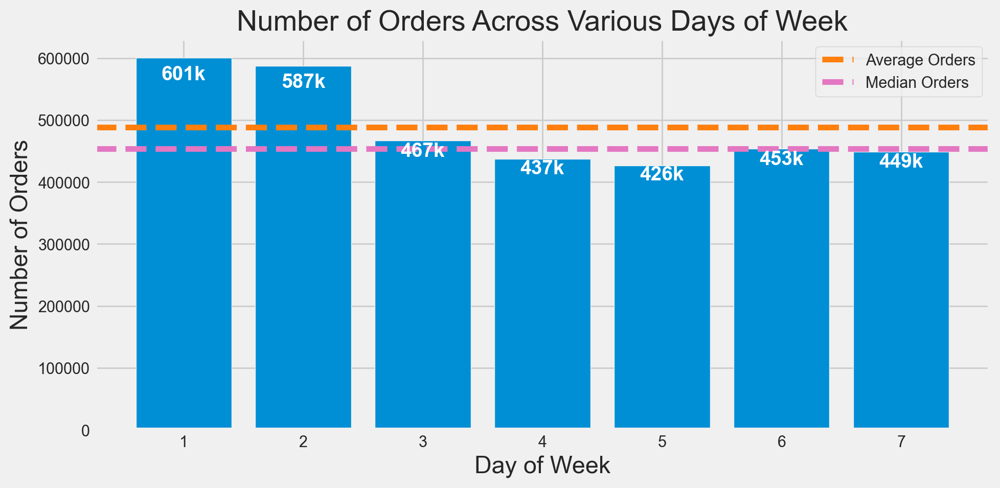

In [21]:
# Modify the index to start from 1
orders_per_day = df_orders.order_dow.value_counts()

# Sorting the index to have a sequential x-axis
orders_per_day = orders_per_day.sort_index()

# Modify the index to start at 1 instead of 0
orders_per_day.index = orders_per_day.index + 1

# Calculate the average and median
avg_orders_day = orders_per_day.values.mean()
median_orders_day = np.median(orders_per_day.values)

# Function to format the values
def format_value(value):
    return "{:.0f}k".format(value/1000) if value >= 1000 else str(value)

plt.figure(figsize=(10, 5), dpi=200)
bars = plt.bar(orders_per_day.index, orders_per_day.values)

# Adding the average and median lines
plt.axhline(avg_orders_day, color='tab:orange',linestyle='--', label='Average Orders')
plt.axhline(median_orders_day, color='tab:pink',linestyle='--', label='Median Orders')

# Displaying the value of each bar inside the bar
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval - 0.07 * yval, format_value(yval),ha='center', va='bottom', color='white', fontweight='bold')

# Adding titles and labels
plt.title('Number of Orders Across Various Days of Week')
plt.xlabel('Day of Week')
plt.ylabel('Number of Orders')
plt.xticks(list(range(1, 8)))# Ensure all days are shown on the x-axis, starting from 1
plt.legend()
plt.tight_layout()
plt.show()

**Days 1 and 2** are the most popular days for shopping by users.

### What is an hourly trend by each day of the week?

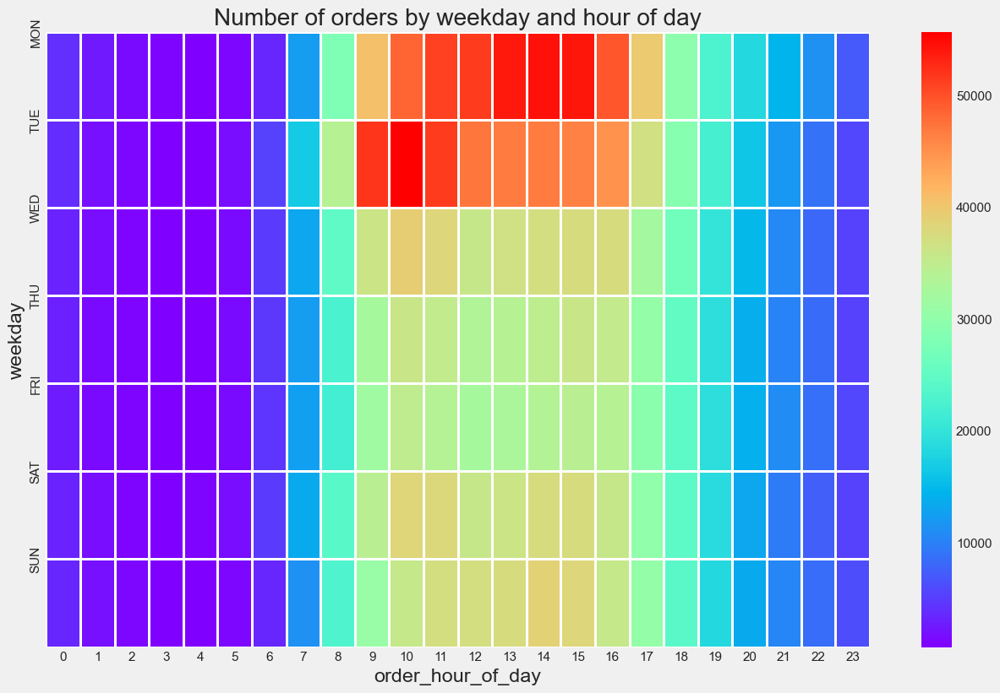

In [ ]:
plt.figure(figsize=(14,9))
sns.heatmap(df_orders.groupby(['order_dow', 'order_hour_of_day']).size().unstack(fill_value=0), cmap="rainbow", linewidth=1)
plt.title("Number of orders by weekday and hour of day")
plt.yticks(ticks= range(0,7),labels=["MON", "TUE", "WED", "THU", "FRI", "SAT", "SUN"])
plt.ylabel("weekday")
plt.show()

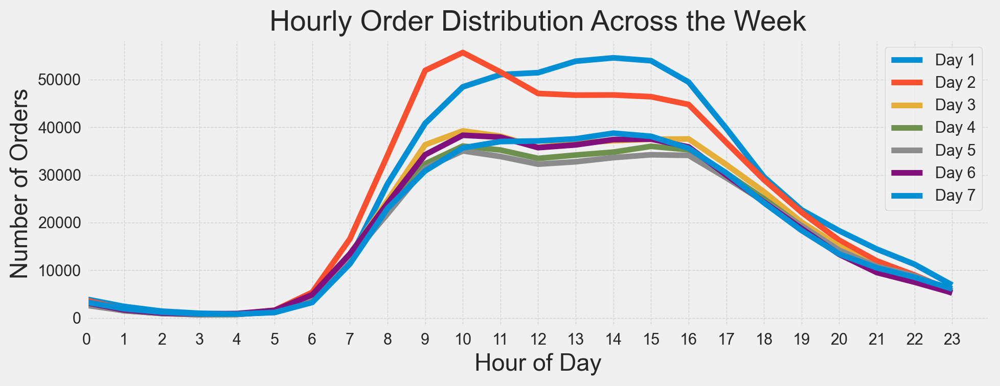

In [23]:
# Grouping by day of the week and hour of the day
day_hour = df_orders.groupby(['order_dow', 'order_hour_of_day']).order_id.count().reset_index()
day_hour = day_hour.rename(columns={'order_id': 'number_of_orders'})

plt.figure(figsize=(10, 4), dpi=200)

# Iterate over the days and plot, starting the day count from 1
for day in range(7):
    subset = day_hour[day_hour['order_dow'] == day]
    plt.plot(subset['order_hour_of_day'], subset['number_of_orders'],label=f'Day {day + 1}')  # Shift day by 1

plt.title('Hourly Order Distribution Across the Week')
plt.xlabel('Hour of Day')
plt.ylabel('Number of Orders')
plt.legend()
plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='lightgrey')
plt.xticks(list(range(24)))
plt.xlim(0, 24)
plt.tight_layout()
plt.show()

### Explanation of the Plot: Hourly Order Distribution Across the Week

This graph reveals interesting trends in customer ordering behavior across different days:

1. **Day 1 and Day 2 (Possibly Sunday and Monday)**:
   - **Day 1 (Sunday)**: Orders peak in the afternoon, particularly between 12:00 and 16:00. This suggests that customers are more likely to order later in the day, possibly after morning activities or relaxation on the weekend.
   - **Day 2 (Monday)**: A distinct trend shows that orders are higher in the morning, peaking between 9:00 and 12:00. This indicates that customers are eager to stock up at the start of the workweek, potentially to prepare for the week ahead.

2. **Day 7 (Saturday)**:
   - Day 7 follows a pattern similar to Day 1 (Sunday), but with **fewer orders overall**. This could be because many people complete their shopping earlier in the week or because they are busy with weekend activities such as leisure, housework, or being outdoors.

3. **Rest of the Week (Days 3–6, Tuesday to Friday)**:
   - Throughout the middle of the week, the hourly order pattern is consistent, with peaks between **8:00 to 11:00**, followed by a small dip around lunchtime (11:00 to 13:00), and a brief uptick at around **16:00** before a steady decline into the evening. The lunch-hour dip might be explained by customers being preoccupied with work or lunch breaks.
   
4. **Customer Behavior Trends**:
   - **Early Morning Peak**: Customers generally order more in the morning across all days, with orders starting to rise sharply between **6:00 and 9:00**, hitting a peak around **9:00 to 11:00**.
   - **Late Afternoon Drop**: After 16:00, orders start declining for all days. This might reflect that most people complete their shopping earlier in the day, with fewer orders happening in the evening.

### Conclusion:
- **Sunday (Day 1)** and **Monday (Day 2)** are the busiest days for orders, but their peak times differ, with Sunday orders peaking in the afternoon and Monday orders peaking in the morning.
- **Saturday (Day 7)** shows a similar pattern to Sunday but with lower overall order volumes, possibly due to weekend activities.
- The rest of the week (Tuesday to Friday) has more consistent ordering behavior, with moderate peaks in the morning and fewer orders in the late afternoon and evening.

This analysis suggests that shopping patterns fluctuate significantly depending on the day of the week, with a preference for morning orders on weekdays and afternoon orders on weekends.

Key observations:
* **On days 0 and 1**, contrasting trends emerge. On day 1, orders predominantly occur in the morning, between 8:00 and 12:00. In contrast, on day 0, most orders are placed in the afternoon, specifically from 12:00 to 16:00.
* **Day 6** has similar trend with day 0, however the number of orders are much lower.
* The hourly trends for **the rest of the week** follow a similar pattern: there's a peak from 8:00 to 11:00, a decline between 11:00 and 13:00, followed by a slight uptick at 16:00. After 16:00, the number of orders starts to decrease.

In accordance with the observations above:
* Looks like day 0 is Sunday, day 1 is Monday, ..., day 6 is Saturday:
    * Users **order from Sunday afternoon till Monday afternoon more actively compared to the rest of week**. Such a behavour might be explained by the desire to stock up on groceries after the weekend.
    * This also corresponds with the fact that a week in the US starts from Sunday.
* **Saturday (6)** exhibits a trend similar to Sunday (0), but with a significantly lower number of orders. People may engage in housekeeping, rest, or outdoor activities on Saturdays, leading to reduced shopping. 
* **From Tuesday (2) to Friday (5)**, order volumes remain relatively stable from 9:00 to 16:00, with a slight dip around lunchtime, likely due to people taking lunch breaks and having less time to place orders.

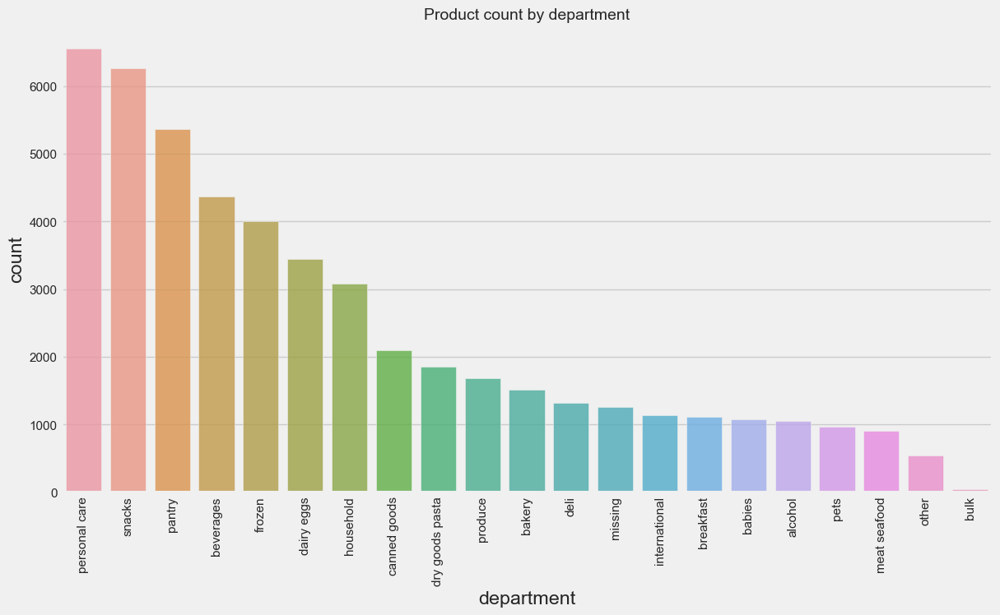

In [25]:
extended_products_df = df_products.merge(df_departments, on="department_id")
extended_products_df = extended_products_df.merge(df_aisles, on="aisle_id")

plt.figure(figsize=(13,7))
plt.title("Product count by department", fontsize=14)
sns.countplot(x="department", data=extended_products_df, order=extended_products_df.department.value_counts().index, alpha=0.8)
plt.xticks(rotation=90)
plt.show()

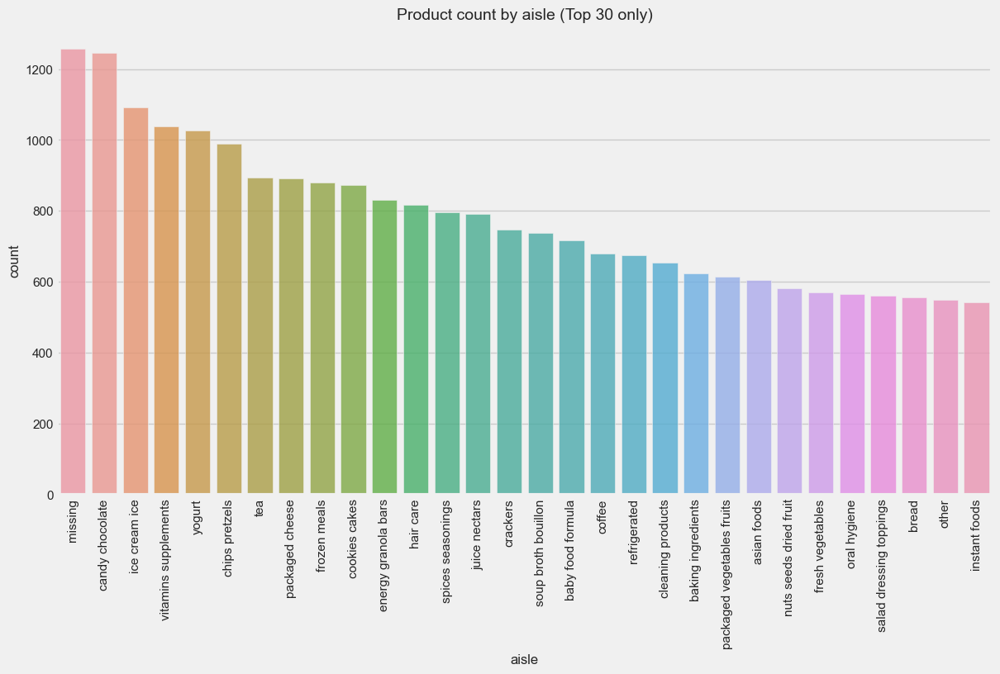

In [26]:
cnt_srs = extended_products_df["aisle"].value_counts().head(30)
plt.figure(figsize=(13,7))
sns.barplot(x=cnt_srs.index, y=cnt_srs.values, alpha=0.8)
plt.title("Product count by aisle (Top 30 only)", fontsize=14)
plt.ylabel("count", fontsize=12)
plt.xlabel('aisle', fontsize=12)
plt.xticks(rotation=90)
plt.show()

<h1 style="font-family: 'Times New Roman'; letter-spacing: 0.08em;">How many items do people usually buy?</h1>

In [28]:
# Calculating the number of products per order
products_in_order = orders_products_df.groupby('order_id').agg({'product_id': pd.Series.count})
products_in_order.rename(columns={'product_id':'products_count'}, inplace=True)
products_in_order.describe()

,products_count
count,3.346083e+06
mean,1.010707e+01
std,7.542326e+00
min,1.000000e+00
25%,5.000000e+00
50%,8.000000e+00
75%,1.400000e+01
max,1.450000e+02


* On average (median) people buy **8 products per order**.
* They buy at least 1 product, and maximum is 145 products.
* 75% of the orders has less than 14 products per order. This means the order with 145 products might be an outlier.

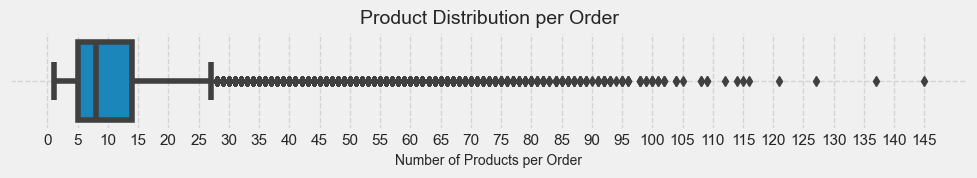

In [29]:
plt.figure(figsize=(10,2))
sns.boxplot(data=products_in_order, x='products_count')
plt.title('Product Distribution per Order', fontsize=14)
plt.xlabel('Number of Products per Order', fontsize=10)
plt.xticks(np.arange(0, products_in_order['products_count'].max()+5, step=5))
plt.grid(True, color='lightgrey', linestyle='--')
plt.tight_layout()
plt.show()

* The median is closer to the bottom of the box and the whisker is shorter on the lower end of the box: the distribution is **positively skewed** (skewed right). In hypothesis testing, correcting for skewness is essential.
* The maximum score, when outliers are excluded, is 27 products per order. This means **27 is the maximum number of products in a typical(standered) order**.
* **Atypical orders** consist of 28 to 145 products per order.

In [30]:
# Estimating outliers
outliers_count = int(products_in_order[products_in_order.products_count > 27].count().iloc[0])
print(f'Outliers count: {outliers_count}')
print(f'Percentage from total: {outliers_count / products_in_order.products_count.count() * 100 :.2}%')

Outliers count: 110280
Percentage from total: 3.3%


Outliers can significantly influence statistical analyse, Since hypothesis testing is not the objective of our current data analysis, there's no necessity to remove these outliers.

<h1 style="font-family: 'Times New Roman'; letter-spacing: 0.08em;">After how many days do people order again?</h1>


In [31]:
df_orders.days_since_prior_order.describe()

count    3.214874e+06
mean     1.111484e+01
std      9.206737e+00
min      0.000000e+00
25%      4.000000e+00
50%      7.000000e+00
75%      1.500000e+01
max      3.000000e+01
Name: days_since_prior_order, dtype: float64

* On average (median) people order again **in 7 days (once per week)** and maximum after 30 days from the last order.
* The minimum value is 0 (indicating NaN values), signifying an absence of previous order history. The value subsequent to 0 would provide a more accurate representation of the minimum interval before ordering again.

In [32]:
# Finding the minimum days before ordering again
df_orders[df_orders.days_since_prior_order > 0].sort_values(by='days_since_prior_order', ascending=True)[:3]

,order_id,user_id,eval_set,order_number,order_dow,order_hour_of_day,days_since_prior_order
1218616,2322872,73266,prior,6,6,20,1.0
2156453,78576,129712,prior,37,2,9,1.0
330278,1511763,20001,prior,90,5,12,1.0


Thus, part of users needs **minimum 1 day to reorder**. 

<h1 style="font-family: 'Times New Roman'; letter-spacing: 0.08em;">How many items people buy since a previous order?
 </h1>


In [33]:
# Calculate the number of products per order
products_per_order = merged_df.groupby('order_id')['product_name'].count().reset_index(name='num_products')

# Merge this information back to the original dataframe
df_merged = merged_df.merge(products_per_order, on='order_id')

# Calculate the average number of products per days_since_prior_order value
avg_products = df_merged.groupby('days_since_prior_order')['num_products'].mean().reset_index()
median_products = df_merged.groupby('days_since_prior_order')['num_products'].median().reset_index()
min_products = df_merged.groupby('days_since_prior_order')['num_products'].min().reset_index()
max_products = df_merged.groupby('days_since_prior_order')['num_products'].max().reset_index()

In [34]:
prods_in_order = merged_df.groupby(['order_id', 'days_since_prior_order']).size().reset_index(name='num_products')
prods_in_order.head(3)

,order_id,days_since_prior_order,num_products
0,1,9.0,8
1,2,8.0,9
2,3,12.0,8


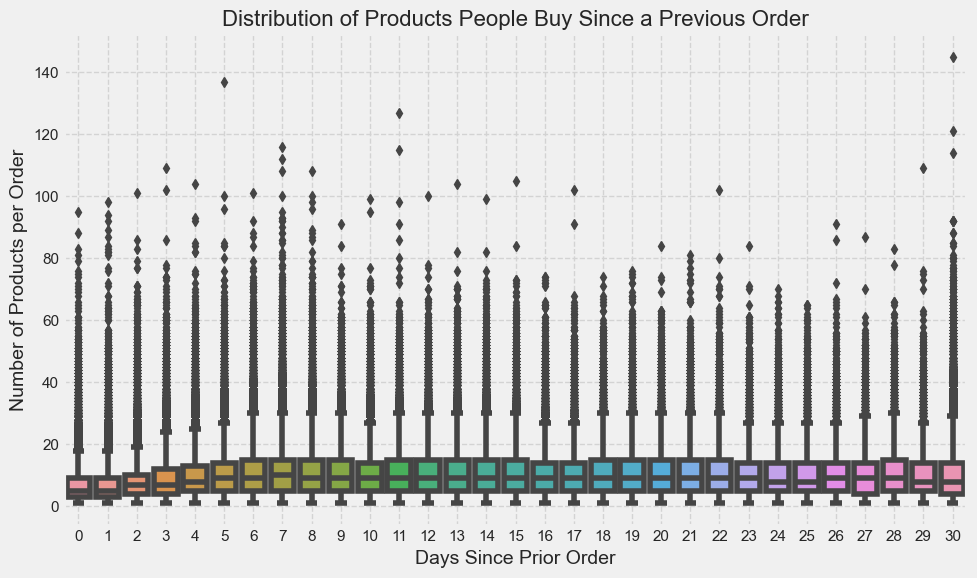

In [35]:
plt.figure(figsize=(10,6))
sns.boxplot(data=prods_in_order, x='days_since_prior_order', y='num_products')
plt.xlabel('Days Since Prior Order', fontsize=14)
plt.ylabel('Number of Products per Order', fontsize=14)
plt.title('Distribution of Products People Buy Since a Previous Order', fontsize=16)
plt.grid(True, color='lightgrey', linestyle='--')
plt.tight_layout()

plt.xticks(ticks=range(int(prods_in_order['days_since_prior_order'].min()), int(prods_in_order['days_since_prior_order'].max()) + 1), 
            labels=range(int(prods_in_order['days_since_prior_order'].min()), int(prods_in_order['days_since_prior_order'].max()) + 1))

plt.show()

To gain a clearer understanding of the trends, it's better to plot key metrics, including the upper whisker, without including a lot of outliers on the chart.

In [36]:
# Calculate upper whisker value for each 'days_since_prior_order'
grouped = prods_in_order.groupby('days_since_prior_order')['num_products']

# Calculate IQR
Q1 = grouped.quantile(0.25)
Q3 = grouped.quantile(0.75)
IQR = Q3 - Q1

# Calculate the upper whisker value
upper_whisker = Q3 + 1.5 * IQR

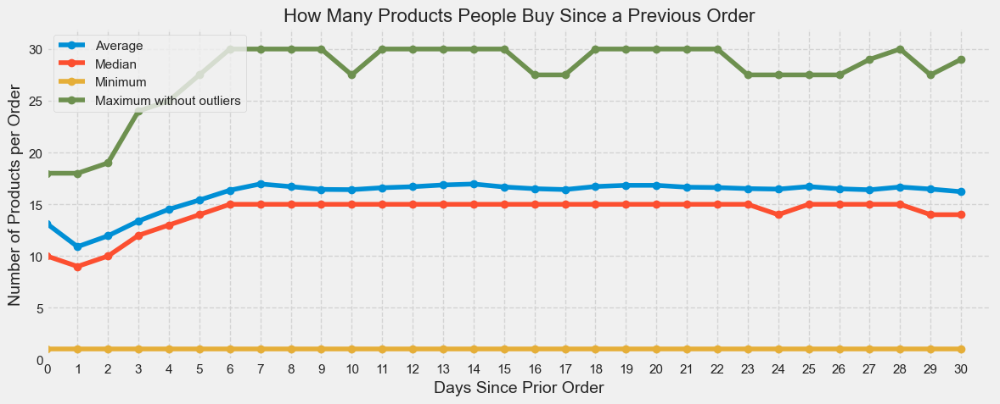

In [37]:
# Plot the data
plt.figure(figsize=(12,5))
plt.plot(avg_products['days_since_prior_order'], avg_products['num_products'], marker='o', label='Average')
plt.plot(median_products['days_since_prior_order'], median_products['num_products'], marker='o', label='Median')
plt.plot(min_products['days_since_prior_order'], min_products['num_products'], marker='o', label='Minimum')
plt.plot(upper_whisker.index, upper_whisker.values, marker='o', label='Maximum without outliers')
plt.xlabel('Days Since Prior Order', fontsize=14)
plt.ylabel('Number of Products per Order', fontsize=14)
plt.title('How Many Products People Buy Since a Previous Order', fontsize=16)
plt.xlim([0, avg_products['days_since_prior_order'].max()+1])
plt.ylim([0, upper_whisker.values.max()+2])
plt.xticks(np.arange(0, avg_products['days_since_prior_order'].max()+1, step=1))
plt.grid(True, color='lightgrey', linestyle='--')
plt.tight_layout()
plt.legend(loc='best')
plt.show()

Typically, when people order:
* They purchase a **minimum** of 1 product, irrespective of the number of days since their previous order.
* For **initial orders**, people typically purchase an average of 10 products and 17 at most.
* **During the first 6 days** following a previous order:
    * the average number of products bought ranges from 9 to 14 per order,
    * they buy between 17 and 27 products at most.
* If there is a gap of **7 days or longer** since the last order:
    * the average number of products per order rises to 15,
    * they purchase between 27 and 30 products at most.

<h1 style="font-family: 'Times New Roman'; letter-spacing: 0.08em;">What are the best selling items?
 </h1>


In [38]:
products_count = orders_products_df.groupby('product_id').agg({'product_name': pd.Series.count})
products_count.rename(columns={'product_name':'product_count'}, inplace=True)

products_sold = pd.merge(products_count, df_products, on='product_id')
products_ranged = products_sold.sort_values('product_count', ascending=False)
top_products = products_ranged[:25]
top_products = top_products.sort_values('product_count', ascending=True)

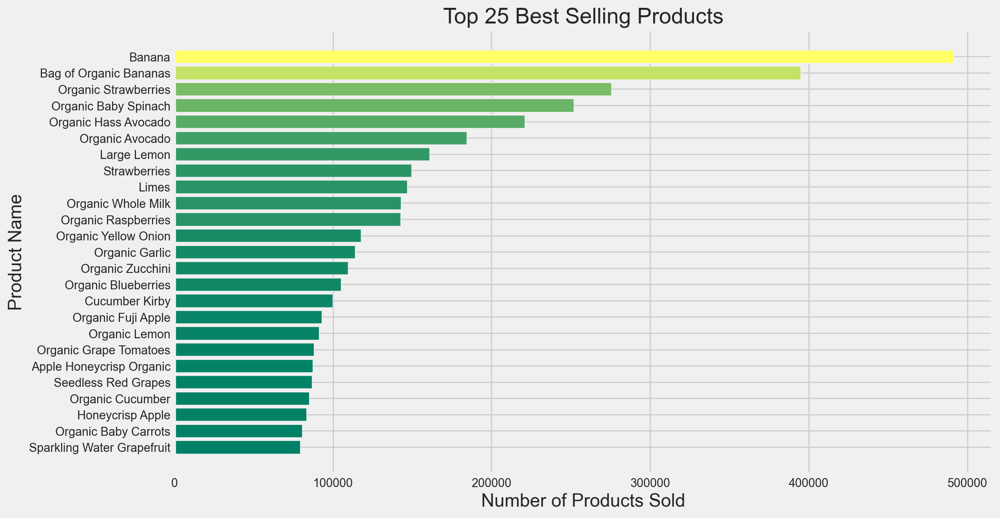

In [39]:
plt.figure(figsize=(12,7), dpi=200)

# Normalize the data and apply colormap
norm = plt.Normalize(min(top_products.product_count), max(top_products.product_count))
colors = cm.summer(norm(top_products.product_count))

plt.barh(top_products.product_name,top_products.product_count,color=colors)
plt.title('Top 25 Best Selling Products')
plt.ylabel('Product Name')
plt.xlabel('Number of Products Sold')
plt.show()

All the top-selling products are fresh fruit, vegetables and organic whole milk. This shows that users care about their health.
* **Banana** stands out as the top-selling product on the platform.
* Following closely are **strawberries, avocado, spinach, and lemon**.

It's surprising that bread and more dairy products aren't among the top products, especially given that bananas, avocado, and spinach are the bestsellers. This could perhaps be influenced by advertising banners on the platform or recommendations promoting these products.

<h1 style="font-family: 'Times New Roman'; letter-spacing: 0.08em;">What items are most frequently re-ordered?
 </h1>


In [40]:
reordered_prods = orders_products_df.groupby('product_name').agg({'reordered': pd.Series.sum})
reordered_prods = reordered_prods[reordered_prods.reordered > 0].sort_values('reordered', ascending=False)
reordered_prods[:3]

,reordered
product_name,
Banana,415166
Bag of Organic Bananas,329275
Organic Strawberries,214448


In [41]:
top_reordered = reordered_prods[:25]
top_reordered = top_reordered.sort_values('reordered', ascending=True)

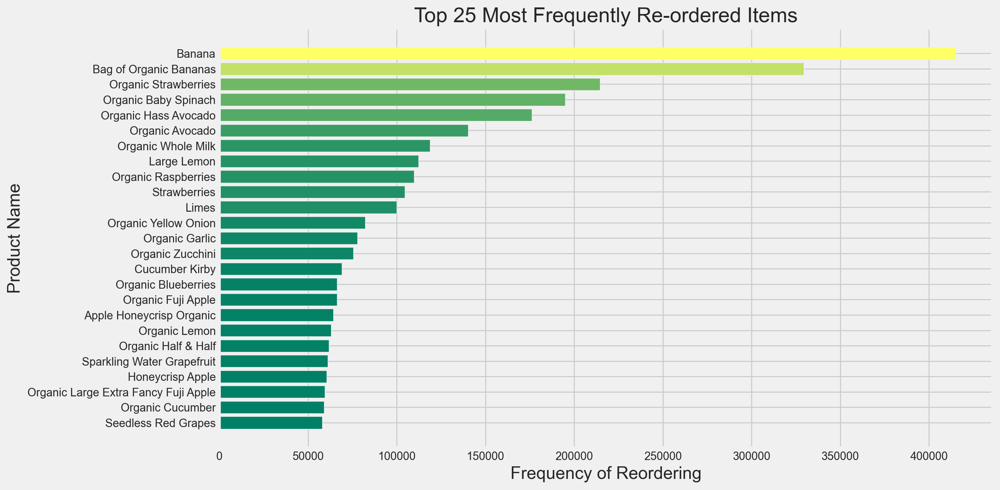

In [42]:
plt.figure(figsize=(12,7), dpi=200)

# Normalize the data and apply colormap
norm = plt.Normalize(min(top_reordered.reordered), max(top_reordered.reordered))
colors = cm.summer(norm(top_reordered.reordered))

plt.barh(top_reordered.index,top_reordered.reordered,color=colors)
plt.title('Top 25 Most Frequently Re-ordered Items')
plt.ylabel('Product Name')
plt.xlabel('Frequency of Reordering')
plt.show()

The list of the most frequently re-ordered items **closely aligns with the bestsellers list**. It's unsurprising since popular products are often re-ordered.
* Bananas again top the chart.
* Followed closely by strawberries, avocado, and spinach.
* The only distinction is the sequence of these products.

All these products might be considered **staples or essential items for many shoppers**.

Given this information, it's crucial to track the availability of these products. This helps maintain a smooth supply chain and prevents interruptions in the availability of products. Ensuring that these products are consistently in stock is crucial for customer satisfaction.

<h1 style="font-family: 'Times New Roman'; letter-spacing: 0.08em;">Which items are added to a cart first? second? third?
 </h1>


In [43]:
# Items which are added to the cart firstly
df_ordered_first = orders_products_df[orders_products_df.add_to_cart_order == 1]
order_1 = df_ordered_first.groupby('product_name').agg({'add_to_cart_order': pd.Series.count}).sort_values('add_to_cart_order', ascending=False)
top_order_1 = order_1[:20]
top_order_1 = top_order_1.sort_values('add_to_cart_order', ascending=True)
top_order_1[:3] # check the DataFrame

,add_to_cart_order
product_name,
Raspberries,9320
Organic Reduced Fat 2% Milk,9644
Half & Half,9847


In [44]:
# Items which are added to the cart secondly
df_ordered_second = orders_products_df[orders_products_df.add_to_cart_order == 2]
order_2 = df_ordered_second.groupby('product_name').agg({'add_to_cart_order': pd.Series.count}).sort_values('add_to_cart_order', ascending=False)
top_order_2 = order_2[:20]
top_order_2 = top_order_2.sort_values('add_to_cart_order', ascending=True)
top_order_2[:3] # check the DataFrame

,add_to_cart_order
product_name,
Raspberries,9237
Half & Half,9510
Organic Yellow Onion,9780


In [45]:
# Items which are added to the cart thirdly
df_ordered_third = orders_products_df[orders_products_df.add_to_cart_order == 3]
order_3 = df_ordered_third.groupby('product_name').agg({'add_to_cart_order': pd.Series.count}).sort_values('add_to_cart_order', ascending=False)
top_order_3 = order_3[:20]
top_order_3 = top_order_3.sort_values('add_to_cart_order', ascending=True)
top_order_3[:3] # check the DataFrame

,add_to_cart_order
product_name,
Apple Honeycrisp Organic,8422
Sparkling Water Grapefruit,8615
Honeycrisp Apple,8712


<h1 style="font-family: 'Times New Roman'; letter-spacing: 0.08em;">Merging these three Data Frames while ensuring no products are lost
 </h1>


In [46]:
# Rename columns to identify the source DataFrame
top_order_1['Firstly'] = top_order_1['add_to_cart_order']
top_order_2['Secondly'] = top_order_2['add_to_cart_order']
top_order_3['Thirdly'] = top_order_3['add_to_cart_order']

# Merge the DataFrames using outer join
top_prods_123 = pd.merge(top_order_1, top_order_2, how='outer', on='product_name')
top_prods_123 = pd.merge(top_prods_123, top_order_3, how='outer', on='product_name')

# Fill NaN values with 0
top_prods_123 = top_prods_123.fillna(0)

# Drop original columns
top_prods_123 = top_prods_123.drop(['add_to_cart_order', 'add_to_cart_order_x', 'add_to_cart_order_y'], axis=1)

In [47]:
# Create a copy of the merged DataFrame and sort it by the total units sold
sorted_top_prods = top_prods_123.copy()
sorted_top_prods['Total'] = sorted_top_prods['Firstly'] + sorted_top_prods['Secondly'] + sorted_top_prods['Thirdly']
sorted_top_prods = sorted_top_prods.sort_values(by='Total', ascending=True)

In [48]:
# Plotting
bar_split = px.bar(sorted_top_prods, x=['Firstly', 'Secondly', 'Thirdly'],
                y=sorted_top_prods.index, labels={'value': 'Units Sold', 'product_name': 'Product', 'variable': 'Added to cart:'},
                title='Top 27 Products Added to Cart Initially, Subsequently, and Thirdly', color_discrete_sequence=px.colors.qualitative.T10)

bar_split.update_layout(yaxis_tickfont=dict(size=10),title_font=dict(size=16))
bar_split.show()

The sequence of product additions shed light on how customers typically navigate the store.

There are main 3 product groups based on the chart above:

* **Group 1:**
    * These products are highly likely to be purchased. They are ordered firstly, secondly and thirdly. They might even be present in the majority of orders placed on the platform.
    * Bananas, strawberries, avocado, spinach, whole milk, raspberies, lemon, limes.
* **Group 2:**
    * These products, which are added secondly and thirdly or firtsly and secondly, still garner a significant number of orders.
    * Fuji apples, cucumber kirbi, blueberries, yellow onion, half & half, raspberries.
* **Group 3:**
    * They have a comparable number of units sold, but fewer than the previous two groups.
    * Soda, reduced fat milk, hass avocados, garlic, honeycrisp apple.

#### Implications:
* This chart again aligns closely with the bestsellers list and the list of the most frequently re-ordered items.
* All these products might be considered as **staples or essential items for many shoppers**.
* Shoppers definetely **start with these essentials** and then mostlikely move to discretionary items.
* All these products **might be prioritized** displaying prominently when a user first logs in or visits the site.
* **Bundle deals** can be offered or **recommended related products** to increase the average order value.

Previously, we focused solely on the top-selling products. Given that the platform offers nearly 50,000 products, analysing the order frequency for all of them can be overwhelming. Therefore, a more effective approach would be to explore the 134 aisles instead.

<h1 style="font-family: 'Times New Roman'; letter-spacing: 0.08em;">Which aisles are more likely to be reordered from?
 </h1>


For normalization purposes, we will use the **percentage of re-ordered products from an aisle** relative to the total number of products sold from that aisle.

In [49]:
# Calculate total purchases
total_aisle = orders_products_df.groupby('aisle')['reordered'].count().reset_index()
total_aisle.rename(columns={'reordered': 'total_purchases'}, inplace=True)

# Calculate purchases with reordered products
reodered_aisle = orders_products_df.groupby('aisle')['reordered'].sum().reset_index()

# Create the DataFrame with 'reordered' and 'total_purchases' columns
merged_aisle = pd.merge(total_aisle, reodered_aisle, on='aisle')
merged_aisle['percent_reorder'] = (merged_aisle.reordered / merged_aisle.total_purchases) * 100

In [50]:
df_deps = orders_products_df[['aisle', 'department']].drop_duplicates()

# Merge the DataFrames using a left merge
dept_aisle_df = merged_aisle.merge(df_deps[['aisle', 'department']], on='aisle', how='left')
dept_aisle_df.head()

,aisle,total_purchases,reordered,percent_reorder,department
0,air fresheners candles,20918,6500,31.073716,household
1,asian foods,173614,60986,35.127351,international
2,baby accessories,8466,4669,55.150012,babies
3,baby bath body care,8909,2626,29.475811,babies
4,baby food formula,395654,233042,58.900453,babies


In [51]:
# Determine a threshold: the 90th percentil
threshold = dept_aisle_df['total_purchases'].quantile(0.90)

# Create a new column for display text
dept_aisle_df['text_display'] = dept_aisle_df.apply(lambda row: row['aisle'] if row['total_purchases'] > threshold else '', axis=1)
fig = px.scatter(dept_aisle_df,
                x='total_purchases',y='percent_reorder',size='total_purchases', color='department',
                color_discrete_sequence=px.colors.qualitative.T10,text='text_display', hover_name='aisle')

fig.update_traces(textposition='top center')
fig.update_xaxes(title_text='Number of Purchases', range=[0, 4000000],)
fig.update_yaxes(title_text='Percent Reordered Purchases')
fig.update_layout(title='Reordered Purchases by Aisle', title_font=dict(size=20))
fig.show()

**The most common aisles** are more likely to be reordered from:
* Fresh fruits and vegetables, milk, water: products from these aisle were in the top-selling and top-re-ordering lists,
* Yogurt, soy lactosefree, bread, refrigerated, eggs, cheese: products with hifg re-ordering frequence, but with less number of purchases. Looks like shoppers needs them, but do not consume in big quantity.

It's interesting, why **fresh fruits are reordered more frequently than vegetables**. This might be connected with several reasons:
* Fruits generally have a shorter shelf life compared to many vegetables. This means that consumers might run out of fruits faster and need to reorder more often.
* Fruits can be consumed in various forms – raw, in smoothies, juices, desserts, or as snacks. This versatility might increase the frequency of consumption.
* Taste and preferances - some consumers might prefer the taste of fruits over vegetables, making them buy fruits more frequently.

Spices seasonings, condiments, baking ingredients are **least likely to be reordered** — perhaps because they are less frequently needed.

### How often are products from the department/aisle sold?

In [52]:
products_with_dept = pd.merge(products_sold, df_departments, on='department_id')
depts_ranged = products_with_dept.groupby('department').agg({'product_count': pd.Series.sum}).sort_values('product_count',ascending=False)

In [53]:
donut = px.pie(depts_ranged,names=depts_ranged.index,
            values='product_count',title='Orders by Department',
            hole=0.5,color_discrete_sequence=px.colors.qualitative.T10)
donut.show()

Based on the department's share of the total number of orders, we can categorize them into four distinct groups:

**Group 1 - Top departments (~46%)**
* The largest department, comprising nearly 30% of all orders, is the **produce department**.
* The second most significant department, **dairy eggs**, is approximately half the size of the #1 department.
* Both produce and dairy eggs are top-priority departments on the platform.  Products from these departments are the best sellers, are frequently reordered and added to cart initially, subsequently, and thirdly.

**Group 2 - Major departments (~30%)**
* Snacks, beverages, frozen and pantry goods each account for a similar percentage of orders, ranging from 5% to 10% of all orders.

These two groups of departments generate **76%** of all sales on the platform and should be in the **primary focus** of further investigation.

**Group 3 - Small departments (~20%)**
* The following departments fall into this category, representing between 2% and 5% of orders each: bakery, canned goods, deli, dry goods, pasta, household, meat seafood and breakfast. Although smaller in scale, these departments may still hold significance for our users.

**Group 4 - Niche departments (~4%)**
* The remaining departments, such as personal care, baby products, international items, alcohol, and pet supplies, each contribute to less than 1.5% of total sales. Given their minimal impact on overall sales, this group is not a primary focus for further research.

In [54]:
prod_aisle_dept = pd.merge(products_with_dept, df_aisles, on='aisle_id')
prod_aisle_dept[:3] # check the DataFrame

,product_id,product_count,product_name,aisle_id,department_id,department,aisle
0,1,1928,Chocolate Sandwich Cookies,61,19,snacks,cookies cakes
1,2,94,All-Seasons Salt,104,13,pantry,spices seasonings
2,3,283,Robust Golden Unsweetened Oolong Tea,94,7,beverages,tea


In [55]:
aisle_counts = prod_aisle_dept.groupby('aisle')['product_count'].sum().reset_index()

In [56]:
# Determine the department for each aisle
aisle_department = prod_aisle_dept.groupby('aisle')['department'].agg(pd.Series.mode).reset_index()

In [57]:
# Merge the two DataFrames
aisle_dept = pd.merge(aisle_counts, aisle_department, on='aisle').sort_values(by='product_count', ascending=False)
aisle_dept.head()

,aisle,product_count,department
50,fresh fruits,3792661,produce
53,fresh vegetables,3568630,produce
98,packaged vegetables fruits,1843806,produce
133,yogurt,1507583,dairy eggs
93,packaged cheese,1021462,dairy eggs


In [58]:
# Find the top aisles
top_aisles = aisle_dept.nlargest(25, 'product_count')['aisle'].tolist()

# Create a new column that either has the aisle name or 'other_aisles'
aisle_dept['aisle_grouped'] = aisle_dept['aisle'].apply(lambda x: x if x in top_aisles else 'other aisles')

In [59]:
top_aisles = aisle_dept.nlargest(25, 'product_count')

In [60]:
fig = px.bar(top_aisles,
            x='product_count', y='aisle',
            color='department', color_discrete_sequence=px.colors.qualitative.T10,
            orientation='h', title="Top 25 Aisles")

fig.update_layout(yaxis=dict(tickfont=dict(size=9)))
fig.update_layout(
    title_font=dict(size=20),
    xaxis_title="Products Ordered",
    yaxis_title="Aisle",
    yaxis_categoryorder='total ascending',
    xaxis=dict(titlefont=dict(size=14)),
    yaxis=dict(titlefont=dict(size=14)))

fig.show()

Once again, the top chart prominently **features the most common aisles or essential categories** for grosery shopping.

* As expected:
    * the largest aisles are dedicated to produce (encompassing fresh and packaged fruits and vegetables, as well as fresh herbs) and dairy eggs (including yogurt, cheese, milk, soy lactose-free products, and eggs).
    * additionally, the chart showcases aisles related to other vital departments: beverages, snacks, and frozen items.


* Notably,  that some of the **top-ranking aisles belong to smaller or niche departments**:
    * bread (from the bakery department)
    * lunch meat (deli)
    * baby food formula (babies)
    * cereal (breakfast)
    * soup broth bouillon (canned goods)

* These observations suggest that these departments might not offer a vast variety of aisles or a wide product range.


* Interestingly, the top aisles do not feature any from the **pantry** department. It piques curiosity about the specific aisles that constitute this department. There seems to be an extensive selection of aisles and products within this category.


To gain a deeper understanding of the sales distribution across departments and aisles, an interactive tree map is needed.

In [61]:
fig = px.treemap(prod_aisle_dept, path=['department', 'aisle', 'product_name'], values='product_count',color_discrete_sequence=px.colors.qualitative.T10)
fig.update_layout(title='Interactive Tree Map: Department -> Aisle -> Product')
fig.show()

* Visually, it's evident that certain **small and niche departments have popular aisles** that make their way into the top chart.
* The hypothesis regarding the **pantry** department holds true: it is more fragmented in terms of aisles compared to smaller and niche departments such as deli, bakery, breakfast, babies, and canned goods. Within the pantry department, there are various aisles with a broad range of products that are infrequently purchased, such as baking ingredients, spreads, oils and vinegars, and seasonings.

### When are products from different department/aisle sold?

#### Orders by aisle during the day

In [62]:
aisles_list = merged_df.groupby('aisle').size().index

The trend for 134 departments is ambiguous; normalisation is needed. It's better to substitute the number of purchases with the percentage of orders (where the total orders for a department in a day equals 100%).

In [63]:
agg_aisles_day = (merged_df.groupby(['aisle', 'order_hour_of_day'])
                .size()
                .reset_index(name='hour_sales')
                .sort_values('order_hour_of_day', ascending=False))

# Calculate total sales per aisle and percent of orders 
agg_aisles_day['total_sales'] = agg_aisles_day.groupby('aisle')['hour_sales'].transform('sum')
agg_aisles_day['percent_of_orders'] = (agg_aisles_day['hour_sales'] / agg_aisles_day['total_sales']) * 100
agg_aisles_day.head() # Check the DataFrame

,aisle,order_hour_of_day,hour_sales,total_sales,percent_of_orders
3215,yogurt,23,19461,1507583,1.290874
2495,popcorn jerky,23,1789,170441,1.049630
2447,pickled goods olives,23,1566,117521,1.332528
3143,vitamins supplements,23,611,47028,1.299226
3095,trail mix snack mix,23,331,37053,0.893315


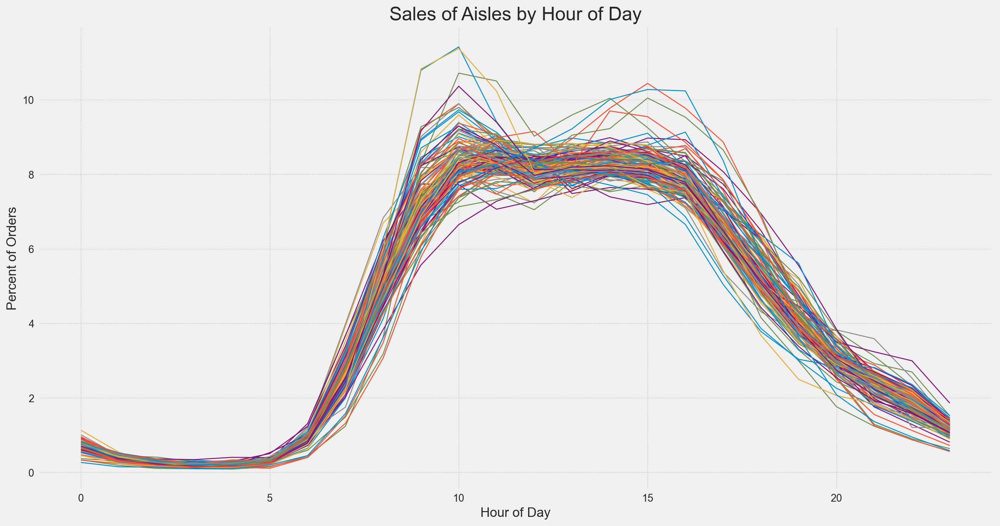

In [64]:
plt.figure(figsize=(15,8), dpi=200)
for aisle in aisles_list:
    subset = agg_aisles_day[agg_aisles_day['aisle'] == aisle]
    plt.plot(subset['order_hour_of_day'], subset['percent_of_orders'], label=aisle, linewidth=1.0)

plt.title('Sales of Aisles by Hour of Day', fontsize=20)
plt.xlabel('Hour of Day', fontsize=14)
plt.ylabel('Percent of Orders', fontsize=14)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()

The trend for each aisle is unclear due to the high number of aisles. Clustering the aisles would provide a clearer understanding of the trends.

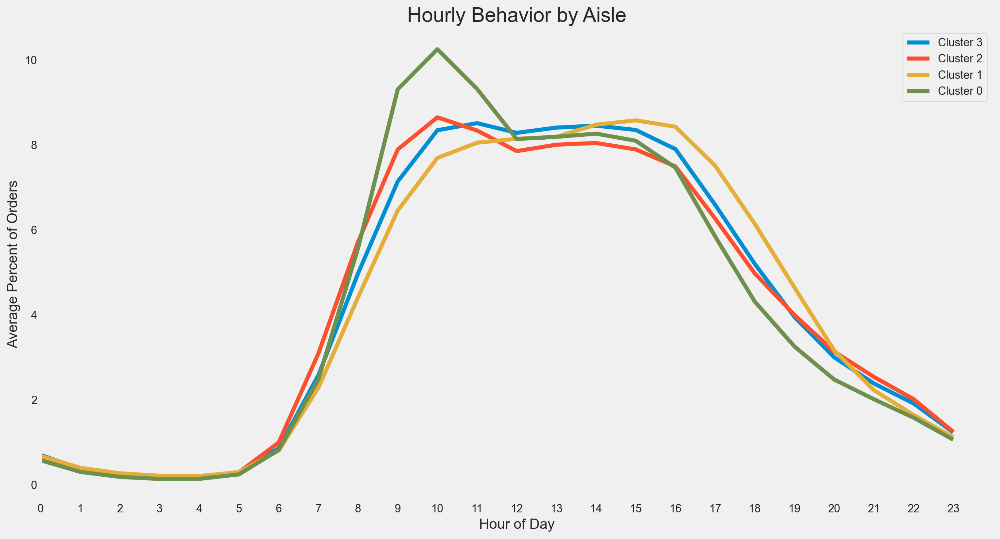

In [65]:
# Prepare data for clustering: Create a pivot table with 'order_hour_of_day' as columns
pivot_df = agg_aisles_day.pivot_table(index='aisle', columns='order_hour_of_day', values='percent_of_orders')

# Clustering aisles based on their hourly patterns
kmeans = KMeans(n_clusters=4, random_state=56)  # Assuming 4 clusters and setting a fixed random seed
clusters = kmeans.fit_predict(pivot_df)
pivot_df['cluster'] = clusters

# Plotting
plt.figure(figsize=(15, 8), dpi=200)

for cluster in pivot_df['cluster'].unique():
    subset = pivot_df[pivot_df['cluster'] == cluster]
    # Calculate the mean percent_of_orders for each hour in this cluster
    mean_percent = subset.mean(axis=0)[:-1]  # Excluding the cluster column from the mean calculation
    plt.plot(mean_percent.index, mean_percent.values, label=f'Cluster {cluster}')

plt.xlim([0, 24])
plt.xticks(np.arange(0, 24, step=1))  # Setting x-axis to show every hour
plt.xlabel('Hour of Day', fontsize=14)
plt.ylabel('Average Percent of Orders', fontsize=14)
plt.title('Hourly Behavior by Aisle', fontsize=20)
plt.legend()
plt.grid(False)
plt.show()

* Aisles in Clusters 0 and 2 exhibit contrasting behaviour during the morning and afternoon. However, the difference is not dramatically large.
* Products in aisle Cluster 1 tend to be purchased earlier in the day, whereas in Cluster 3 are far more popular when customers are ordering in the evening.

Let's explore aisles in each cluster.

In [66]:
# List the aisles for each cluster:
for cluster in pivot_df['cluster'].unique():
    aisles_in_cluster = pivot_df[pivot_df['cluster'] == cluster].index.tolist()
    print(f"Cluster {cluster} contains the following aisles:")
    for aisle in aisles_in_cluster:
        print(aisle)
    print("\n")

Cluster 3 contains the following aisles:
air fresheners candles
asian foods
baking ingredients
baking supplies decor
bread
buns rolls
butter
candy chocolate
canned jarred vegetables
canned meals beans
canned meat seafood
chips pretzels
condiments
cookies cakes
digestion
doughs gelatins bake mixes
dry pasta
eggs
energy sports drinks
feminine care
fresh dips tapenades
fresh herbs
fresh vegetables
frozen appetizers sides
frozen breads doughs
frozen meat seafood
frozen produce
grains rice dried goods
hot dogs bacon sausage
instant foods
juice nectars
kitchen supplies
latino foods
lunch meat
marinades meat preparation
meat counter
missing
more household
muscles joints pain relief
oils vinegars
oral hygiene
other
other creams cheeses
packaged cheese
packaged meat
packaged poultry
packaged seafood
packaged vegetables fruits
paper goods
pasta sauce
pickled goods olives
popcorn jerky
poultry counter
prepared soups salads
preserved dips spreads
protein meal replacements
refrigerated
salad dressi

**Cluster 0:**
This cluster encompasses a wide range of household essentials and grocery staples. It includes fresh produce like fruits and vegetables, dairy products such as eggs and butter, and a variety of packaged and canned foods. Additionally, it covers baby care items, household supplies, condiments, snacks, and baking ingredients. Frozen foods, meat and seafood, as well as grains and pasta, are also part of this diverse cluster, making it a comprehensive collection of everyday necessities.

**Cluster 1:**
Focused on convenience and quick meals, this cluster primarily caters to breakfast and lunch needs, especially for those on the go. It includes milk, yogurt, coffee, breakfast bakery items, and soft drinks. Also featured are snacks like granola bars, trail mixes, and dried fruits. Additionally, this cluster covers cleaning products, baby food, and beverages like tea, water, and beer, making it ideal for quick and easy meal solutions and refreshments.

**Cluster 2:**
This cluster is centered around frozen foods, pet care, and personal care products. It includes frozen meals, desserts, and pizzas, as well as fresh pasta and meat alternatives. Beauty and self-care products like body lotions, facial care, and deodorants are also prominent. Additionally, pet food and care items for dogs and cats are included, along with various first aid and health products.

**Cluster 3:**
Dedicated solely to alcoholic beverages, this cluster includes a selection of wines (red, white, and specialty wines), champagnes, and spirits. This specialized cluster caters to those looking for alcoholic drinks for various occasions and preferences.

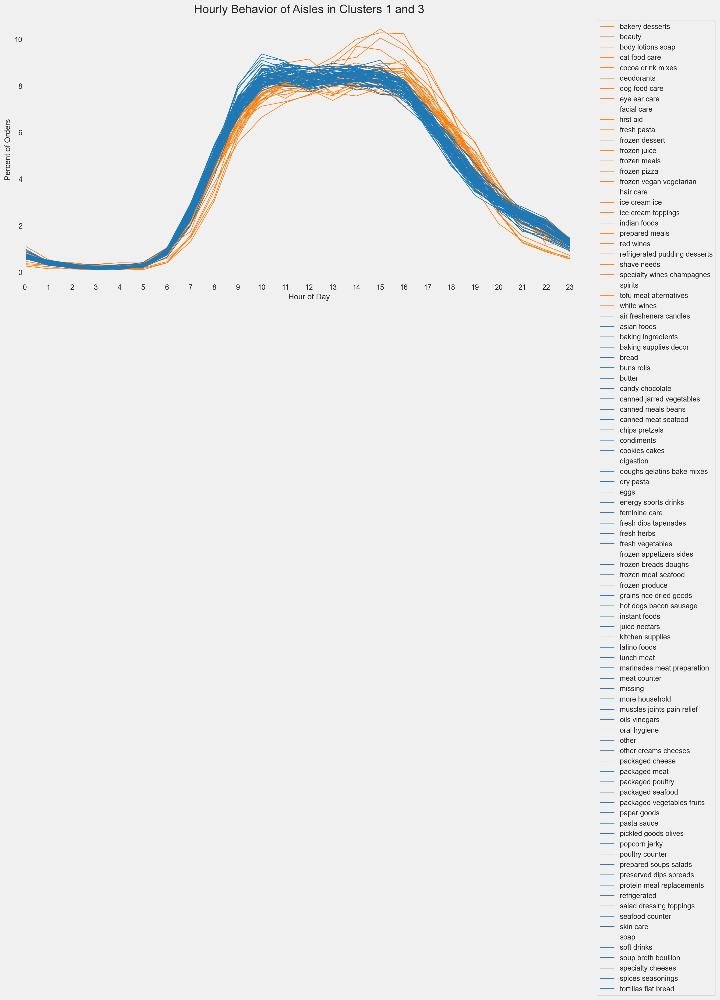

In [67]:
# Define colors for the clusters
color_map = {1: 'tab:orange', 3: 'tab:blue'}

# Plotting
plt.figure(figsize=(14, 7), dpi=200)

# Plotting aisles in clusters
for cluster, color in color_map.items():
    subset = pivot_df[pivot_df['cluster'] == cluster]
    for _, row in subset.iterrows():
        plt.plot(row.index[:-1], row.values[:-1], label=row.name, color=color, linewidth=1.0)

plt.xlim([0, 24])
plt.xticks(np.arange(0, 24, step=1))  # Setting x-axis to show every hour
plt.xlabel('Hour of Day', fontsize=12)
plt.ylabel('Percent of Orders', fontsize=12)
plt.title('Hourly Behavior of Aisles in Clusters 1 and 3', fontsize=18)
plt.legend(loc='upper left', bbox_to_anchor=(1,1), ncol=1)  # Adjust legend location and layout for better visibility
plt.grid(False)
plt.tight_layout()
plt.show()

#### Orders by aisles during the week

Let's explore shopping trends by day of the week. Combined with hourly trends, this analysis will provide a comprehensive view of when and what products are purchased on the platform.

In [68]:
agg_aisles_week = (merged_df.groupby(['aisle', 'order_dow'])
                 .size()
                 .reset_index(name='day_sales')
                 .sort_values('order_dow', ascending=False))

# Calculate total sales per aisle and percent of orders 
agg_aisles_week['total_sales'] = agg_aisles_week.groupby('aisle')['day_sales'].transform('sum')
agg_aisles_week['percent_of_orders'] = (agg_aisles_week['day_sales'] / agg_aisles_week['total_sales']) * 100

agg_aisles_week.head() # Check the DataFrame

,aisle,order_dow,day_sales,total_sales,percent_of_orders
937,yogurt,6,193653,1507583,12.845263
923,water seltzer sparkling water,6,106426,878150,12.119342
447,frozen vegan vegetarian,6,16371,104096,15.726829
272,dog food care,6,5586,35915,15.553390
839,soy lactosefree,6,89510,664493,13.470420


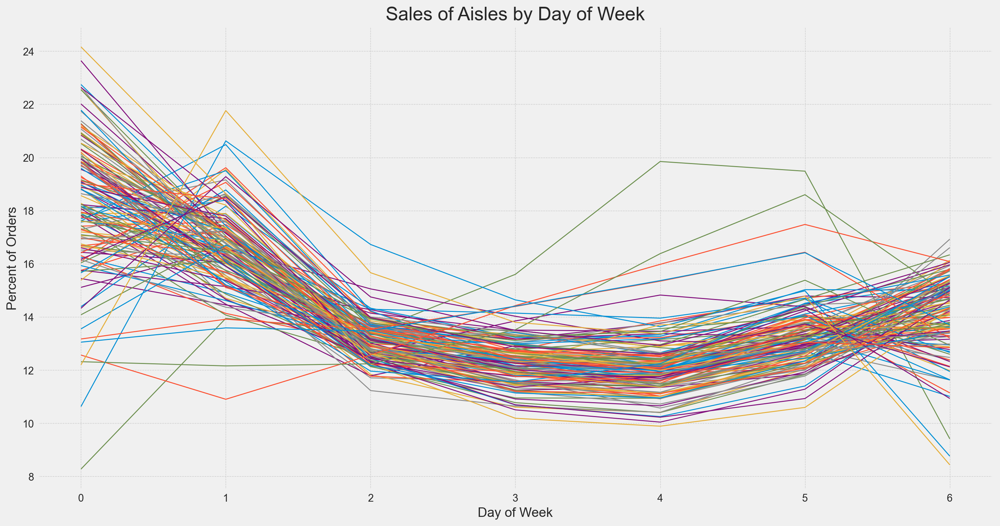

In [69]:
plt.figure(figsize=(15,8), dpi=200)
for aisle in aisles_list:
    subset = agg_aisles_week[agg_aisles_week['aisle'] == aisle]
    plt.plot(subset['order_dow'], subset['percent_of_orders'], label=aisle, linewidth=1.0)

#plt.legend(loc="upper left")

plt.title('Sales of Aisles by Day of Week', fontsize=20)
plt.xlabel('Day of Week', fontsize=14)
plt.ylabel('Percent of Orders', fontsize=14)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()

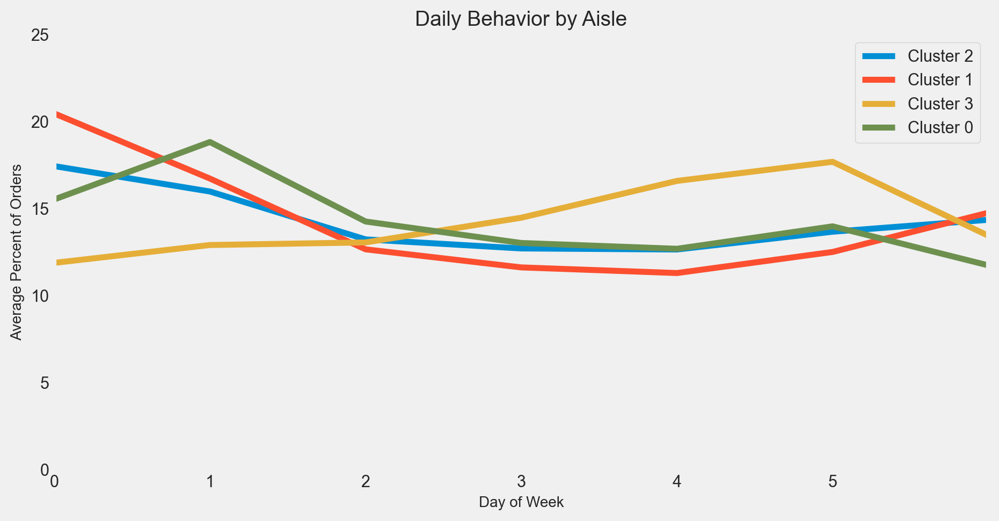

In [70]:
# Prepare data for clustering: Create a pivot table with 'order_hour_of_day' as columns
pivot_df2 = agg_aisles_week.pivot_table(index='aisle', columns='order_dow', values='percent_of_orders')

# Clustering aisles based on their hourly patterns
kmeans = KMeans(n_clusters=4, random_state=56)  # Assuming 4 clusters and setting a fixed random seed
clusters = kmeans.fit_predict(pivot_df2)

pivot_df2['cluster'] = clusters

# Plotting
plt.figure(figsize=(10, 5), dpi=200)

for cluster in pivot_df2['cluster'].unique():
    subset = pivot_df2[pivot_df2['cluster'] == cluster]
    # Calculate the mean percent_of_orders for each hour in this cluster
    mean_percent = subset.mean(axis=0)[:-1]  # Excluding the cluster column from the mean calculation
    plt.plot(mean_percent.index, mean_percent.values, label=f'Cluster {cluster}')

plt.xlim([0, 6])
plt.ylim([0, 25])
plt.xticks(np.arange(0, 6, step=1))  # Setting x-axis to show every hour
plt.xlabel('Day of Week', fontsize=10)
plt.ylabel('Average Percent of Orders', fontsize=10)
plt.title('Daily Behavior by Aisle', fontsize=14)
plt.legend()
plt.grid(False)
plt.show()

- Cluster 3: Noteworthy for the peak in orders on Mondays (1) compared to the rest of the week and other clusters.
- Cluster 2: Significant for the high sales on Fridays (5) compared to the rest of the week and other clusters. Hypothesis: most likely alcohol drinks, snacks.
- Clusters 0 and 1 have the highest sales on Sundays (0) and most likely contain staple products for stock-up purposes.

In [71]:
# List the aisles for each cluster:
for cluster in pivot_df2['cluster'].unique():
    aisles_in_cluster = pivot_df2[pivot_df2['cluster'] == cluster].index.tolist()
    print(f"Cluster {cluster} contains the following aisles:")
    for aisle in aisles_in_cluster:
        print(aisle)
    print("\n")

Cluster 2 contains the following aisles:
air fresheners candles
baby accessories
baby bath body care
bakery desserts
baking ingredients
baking supplies decor
beauty
body lotions soap
butter
cat food care
cereal
chips pretzels
cleaning products
cocoa drink mixes
condiments
crackers
diapers wipes
digestion
dish detergents
dog food care
doughs gelatins bake mixes
energy sports drinks
eye ear care
feminine care
first aid
food storage
frozen dessert
frozen juice
honeys syrups nectars
ice cream ice
ice cream toppings
juice nectars
kitchen supplies
kosher foods
laundry
milk
more household
muscles joints pain relief
oral hygiene
other
packaged seafood
paper goods
refrigerated
refrigerated pudding desserts
soap
specialty cheeses
spreads
trash bags liners
vitamins supplements


Cluster 1 contains the following aisles:
asian foods
baby food formula
bread
bulk grains rice dried goods
buns rolls
canned fruit applesauce
canned jarred vegetables
canned meals beans
canned meat seafood
deodorants
dry p

**Cluster 0:**
This cluster covers a wide range of everyday household and personal care products. It includes air fresheners, candles, baby accessories, and baby bath products. Also featured are bakery desserts, baking supplies, and various beauty and body care items such as lotions, soaps, and cosmetics. Pet care products, cereals, snacks like chips and pretzels, cleaning products, condiments, and refrigerated goods are included. Additionally, this cluster encompasses household essentials like dish detergents, laundry supplies, and trash bags, along with vitamins and supplements.

**Cluster 1:**
Focused on fresh and pantry staples, this cluster includes a variety of foods and personal care items. It features fresh produce like fruits, vegetables, herbs, and pasta, as well as canned goods, dry pasta, and baking ingredients. Also included are various frozen foods, such as breakfast items, meals, and vegan options. Dairy products like eggs and yogurt, as well as meats and seafood from the counter, are part of this cluster. Personal care items, spices, and specialty foods like Asian, Indian, and Latino cuisines round out this diverse group.

**Cluster 2:**
This cluster is dedicated exclusively to alcoholic beverages. It includes a comprehensive selection of beers, coolers, red and white wines, specialty wines, champagnes, and spirits. This specialized cluster caters to various tastes and preferences, providing a wide range of options for those looking to purchase alcoholic drinks for different occasions.

**Cluster 3:**
Centered on snacks, beverages, and breakfast items, this cluster includes breakfast bakery goods, pastries, and energy bars. It features a variety of snacks like candy, chocolate, fruit and vegetable snacks, nuts, seeds, and popcorn. Beverages such as coffee, tea, soft drinks, water, and sparkling water are also included. Additionally, this cluster contains items like cold and flu remedies, cream, granola, packaged produce, and disposable plates, bowls, cups, and flatware.

#### Clustering Results Summary

The combined analyses (hour of day and day of week) reveal clear patterns in customer purchasing behavior:

* Time of Day Trends:
    * Morning purchases are more common for convenience and quick meal items, while evening purchases are dominated by alcoholic beverages.
    * Other products show variations between morning and afternoon but without significant differences.

* Day of Week Trends:
    * Alcoholic beverages peak on Fridays.
    * Monday sees a surge in sales, likely due to increased demand for the upcoming week. It is the busiest day for products like fresh and pantry staples, household and personal care products, indicating that customers use this day to stock up on essential and staple products for the week ahead.

## IV. Findings & Conclusions Summary

### Key metrics:

- Number of Instacart users: **206,209**
- Total placed orders: **3,421,083**
- Placed orders with product information: **3,346,083**
- Each user placed between **4 and 100 orders**
- **49,688 products** are available on the platform. They are organised into **134 aisles** and then into **21 departments**.

### Q.1: How many orders are made at different hours of the day, different days of the week?

- The majority of orders are placed between 8:00 and 19:00, with the highest volume occurring **between 10:00 and 16:00**. There isn't a distinct rush hour. It's natural for grocery orders to be made during the day.
- **Sunday and Monday** are the most popular days for shopping among Instacart users. This finding supports the general observation that consumers have the tendency to shop online for groceries at the beginning of the week, and Mondays and Sundays are the two days that experienced huge traffic in online grocery shopping.
- Users **order from Sunday afternoon till Monday afternoon more actively compared to the rest of week**. Such a behaviour might be explained by the desire to stock up on groceries after the weekend.
    - From Tuesday to Friday, order volumes remain relatively stable from 9:00 to 16:00, with a slight dip around lunchtime, likely due to people taking lunch breaks and having less time to place orders.
    - Saturday exhibits a trend similar to Sunday, but with a significantly lower number of orders. People may engage in housekeeping, rest, or outdoor activities on Saturdays, leading to reduced shopping.

### Q.2: How many items do people buy?

- Users bought **over 33.8 million products** on the platform.
    - NOTE: There is no data on products sold in 75,000 orders, as their content is expected to be predicted. In the available 3,346,083 orders (97.8% of the total), users bought 33,819,106 products. 
- On average (median) users buy **8 products per order**.
    - NOTE: The distribution is positively skewed. In hypothesis testing, correcting for skewness may be necessary.
- Users buy at least 1 product and a maximum of 27 products in a typical order.
- **Atypical orders** (outliers) consist of 28 to 145 products per order.
    - NOTE: 3.3% of all orders are deemed outliers. When conducting hypothesis testing, removing outliers is necessary to promote a more normal distribution.

### Re-Ordering Behaviour

### **Q.3: How many days pass before people place another order?**

- On average, people order groceries online approximately once a week. The same applies to Instacart users: they order again in 7 days (median).
- Initial orders constitute 6.4% of the total orders.

### **Q.4: How many items do people buy since a previous order?**

For **initial orders**, people typically purchase an average of **10 products** with a maximum of 17 products. This suggests that initial orders are relatively conservative, possibly because users are trying out the service or making smaller, essential purchases.

Typically, when people **re-order:**

- **Minimum purchase**: Regardless of the interval since their previous order, users always purchase at least **1 product**. This indicates a consistent need to restock even a small number of items.
- **Short interval** (when re-ordering within 6 days of a previous order):
    - **Average purchase**: ranges from 9 to 14
    - **Maximum purchase**: ranges from 17 to 27
- **Longer interval** (if there is a gap of 7 days or more since the last order):
    - **Average purchase:** increases to 15
    - **Maximum purchase:** increases to between 27 and 30

In summary, users tend to make smaller, frequent purchases when they are actively managing their stock and avoiding running out of essential items. Longer intervals between orders result in larger purchases, indicating planned restocking behavior, possibly due to bulk buying or taking advantage of sales and promotions. Offering promotions or reminders for larger, periodic restocks can help balance the load on the delivery system.

### Q.8: How often and when are products from different departments/aisles sold?

#### Order Frequency by Department

Based on order frequency, Instacart’s departments can be categorised into four distinct groups:

- **Group 1 - Top departments (~46% of total sales):** Both *produce* (30% of total sales) and *dairy & eggs* are top-priority departments on the platform. Products from these departments are best sellers, frequently reordered, and often added to the cart first, second, and third.
- **Group 2 - Major departments (~30%):** *Snacks, beverages, frozen*, and *pantry goods* each account for a similar percentage of orders, ranging from 5% to 10% of all orders.
- **Group 3 - Small departments (~20%):** *Bakery, canned goods, deli, dry goods, pasta, household, meat & seafood*, and *breakfast* represent between 2% and 5% of orders each. Although smaller in scale, these departments may still hold significance for our users.
- **Group 4 - Niche departments (~4%):** The remaining departments, such as *personal care, baby products, international items, alcohol*, and *pet supplies*, each contribute less than 1.5% of total sales. Given their minimal impact on overall sales, this group is not a primary focus.

Groups 1 and 2 generate 76% of all sales on the platform and should be the primary focus.

#### Order Frequency by Aisle

- The largest aisles are dedicated to *produce* (including fresh and packaged fruits and vegetables, as well as fresh herbs) and *dairy & eggs* (encompassing yogurt, cheese, milk, soy lactose-free products, and eggs).
- Small and niche departments have popular aisles that make their way into the top, suggesting that they might not offer a vast variety of aisles or a wide product range:
    - bread (from the bakery department)
    - lunch meat (deli)
    - baby food formula (babies)
    - cereal (breakfast)
    - soup broth bouillon (canned goods)
- The top aisles do not feature any from the *pantry* department. The pantry department is more fragmented in terms of aisles compared to smaller and niche departments. Within the pantry department, there are various aisles with a broad range of products that are infrequently purchased, such as baking ingredients, spreads, oils & vinegars, and seasonings.

#### When Are Popular Products Ordered?

* **Time of day trends:**
    * Morning purchases are more common for convenience and quick meal items, while evening purchases are dominated by alcoholic beverages.
    * Other products show variations between morning and afternoon but without significant differences.

* **Day of week trends:**
    * Alcoholic beverages peak on Fridays.
    * Monday sees a surge in sales, likely due to increased demand for the upcoming week. It is the busiest day for products like fresh and pantry staples, household and personal care products, indicating that customers use this day to stock up on essential and staple products for the week ahead.